In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns 

from sklearn.model_selection import train_test_split
from scipy.stats import pearsonr, spearmanr

import acquireTelco as acq
import prepareTelcoRegression as prep
#import env
#import wrangle

# Explore Exercises

Our Telco scenario continues:

As a customer analyst for Telco, you want to know who has spent the most money with the company over their lifetime. You have monthly charges and tenure, so you think you will be able to use those two attributes as features to estimate total charges. You need to do this within an average of $5.00 per customer.

In these exercises, you will run through the stages of exploration as you continue to work toward the above goal.

Do your work in a notebook named explore.ipynb. In addition, you should create a file named explore.py that contains the following functions for exploring your variables (features & target).

### Exercise I
Make sure to perform a train, validate, test split before and use only your train dataset to explore the relationships between independent variables with other independent variables or independent variables with your target variable.

In [2]:
#grab prepped data
telco = prep.prep_telco()

In [3]:
#at a glance
print(telco.info())
telco.head()

<class 'pandas.core.frame.DataFrame'>
Index: 7032 entries, 2794-XIMMO to 9764-REAFF
Data columns (total 30 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   is_male                   7032 non-null   uint8  
 1   senior_citizen            7032 non-null   int64  
 2   partner                   7032 non-null   int64  
 3   dependents                7032 non-null   int64  
 4   phone_service             7032 non-null   int64  
 5   paperless_billing         7032 non-null   int64  
 6   churn                     7032 non-null   int64  
 7   payment_id                7032 non-null   int64  
 8   internet_service_id       7032 non-null   int64  
 9   contract_id               7032 non-null   int64  
 10  tenure                    7032 non-null   int64  
 11  monthly_charges           7032 non-null   float64
 12  total_charges             7032 non-null   float64
 13  multiple_lines            7032 non-null   uint8  
 14

,is_male,senior_citizen,partner,dependents,phone_service,paperless_billing,churn,payment_id,internet_service_id,contract_id,...,m2m_contract,one_year_contract,two_year_contract,DSL_internet,Fiber_internet,no_internet,bank_auto_payment,card_auto_payment,electronic_check_payment,mailed_check_payment
customer_id,,,,,,,,,,,,,,,,,,,,,
2794-XIMMO,1,0,1,0,0,1,1,1,1,2,...,0,1,0,1,0,0,0,0,1,0
2851-STERV,1,1,0,0,1,1,0,1,1,2,...,0,1,0,1,0,0,0,0,1,0
2898-LSJGD,0,0,1,1,0,1,1,1,1,2,...,0,1,0,1,0,0,0,0,1,0
2969-WGHQO,0,0,1,1,1,0,0,1,1,2,...,0,1,0,1,0,0,0,0,1,0
2988-PLAHS,0,0,0,0,1,1,0,1,1,2,...,0,1,0,1,0,0,0,0,1,0


In [4]:
quant_vars = ['tenure', 'monthly_charges', 'total_charges']
target = 'total_charges'

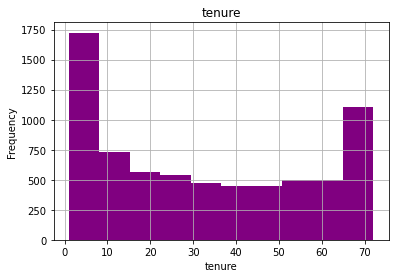

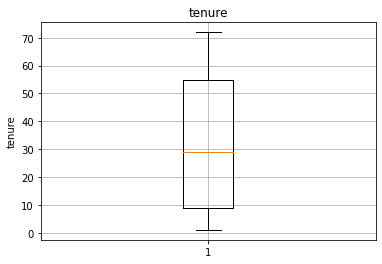

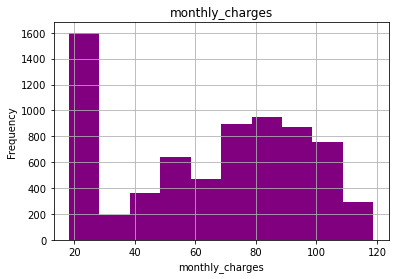

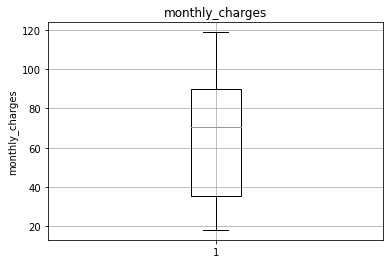

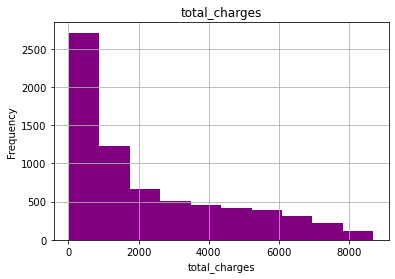

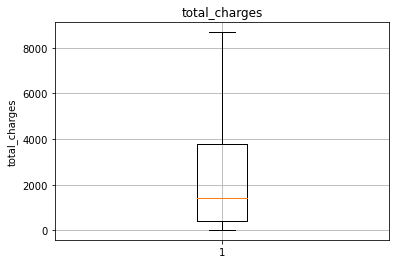

In [5]:
#distributions for numeric variables
for cat in quant_vars:
    telco[cat].hist(color = 'purple')
    plt.title(cat)
    plt.xlabel(cat)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show();
    plt.boxplot(telco[cat])
    plt.title(cat)
    plt.ylabel(cat)
    plt.grid(True)
    plt.show();

In [6]:
cat_vars = telco.columns.to_list()
cat_vars

['is_male',
 'senior_citizen',
 'partner',
 'dependents',
 'phone_service',
 'paperless_billing',
 'churn',
 'payment_id',
 'internet_service_id',
 'contract_id',
 'tenure',
 'monthly_charges',
 'total_charges',
 'multiple_lines',
 'online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'm2m_contract',
 'one_year_contract',
 'two_year_contract',
 'DSL_internet',
 'Fiber_internet',
 'no_internet',
 'bank_auto_payment',
 'card_auto_payment',
 'electronic_check_payment',
 'mailed_check_payment']

In [7]:
cat_vars.remove('tenure')
cat_vars.remove('monthly_charges')
cat_vars.remove('total_charges')
cat_vars

['is_male',
 'senior_citizen',
 'partner',
 'dependents',
 'phone_service',
 'paperless_billing',
 'churn',
 'payment_id',
 'internet_service_id',
 'contract_id',
 'multiple_lines',
 'online_security',
 'online_backup',
 'device_protection',
 'tech_support',
 'streaming_tv',
 'streaming_movies',
 'm2m_contract',
 'one_year_contract',
 'two_year_contract',
 'DSL_internet',
 'Fiber_internet',
 'no_internet',
 'bank_auto_payment',
 'card_auto_payment',
 'electronic_check_payment',
 'mailed_check_payment']

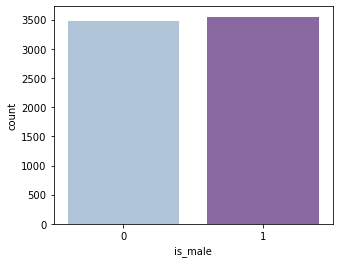

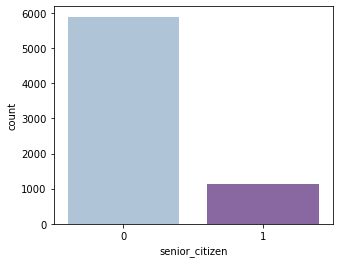

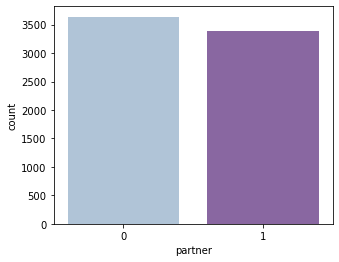

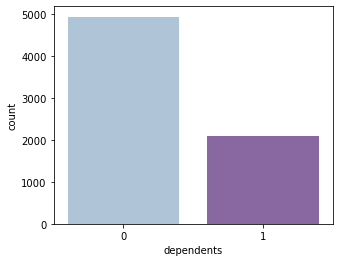

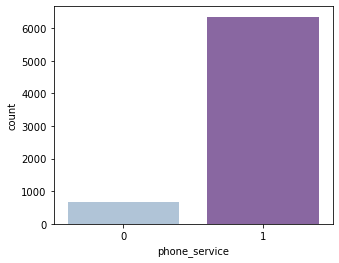

...

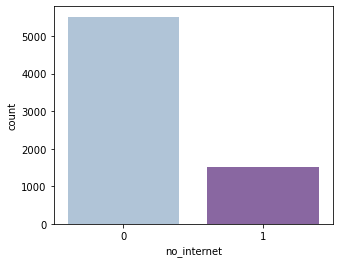

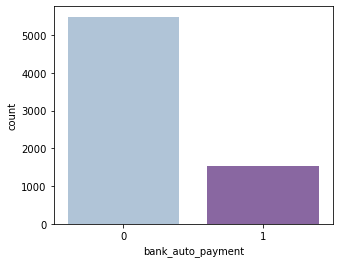

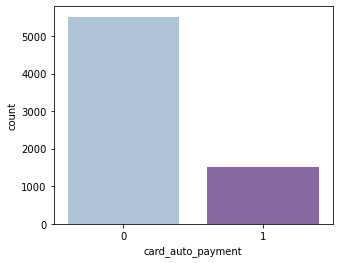

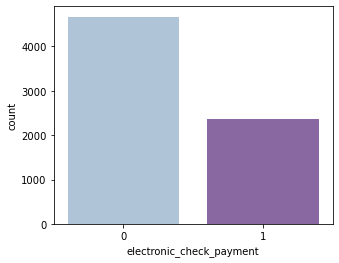

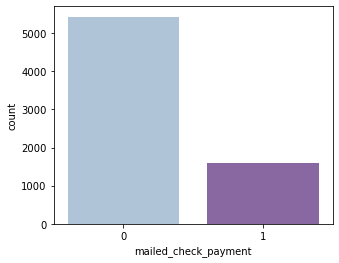

In [8]:
#distributions for categorical columns
for cat in cat_vars:
    plt.figure(figsize = (5, 4))
    sns.countplot(x = cat, data = telco, palette = 'BuPu')

In [9]:
#split the data
train, validate, test = prep.split_telco(telco)

<Figure size 936x504 with 0 Axes>

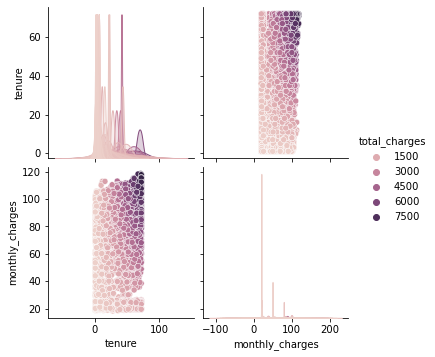

In [10]:
#visualize relationships between numeric columns
plt.figure(figsize = (13, 7))
sns.pairplot(train[quant_vars], hue = 'total_charges');

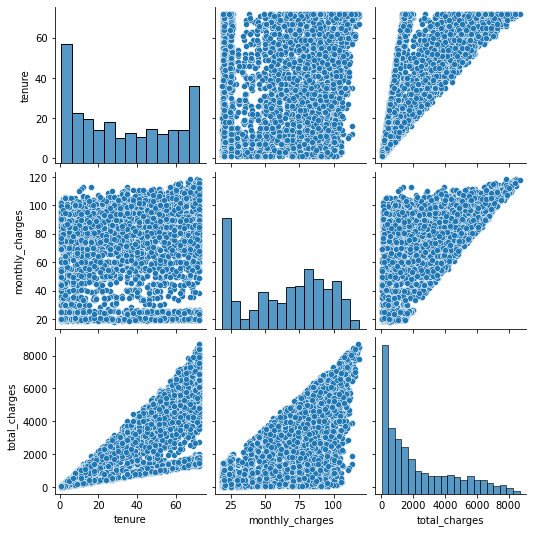

In [11]:
#visualize relationships between continuous variables
sns.pairplot(train[quant_vars]);

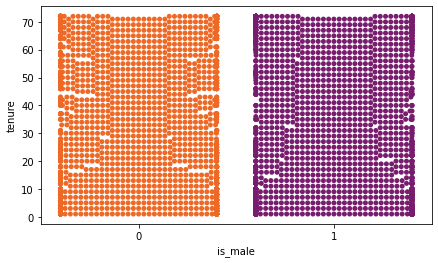

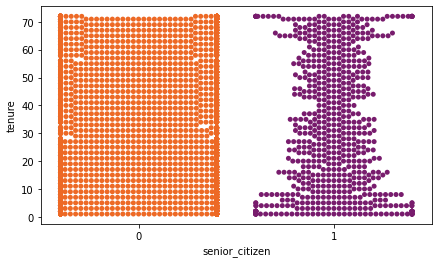

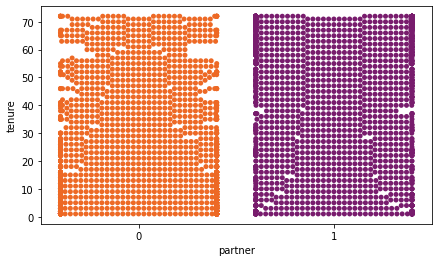

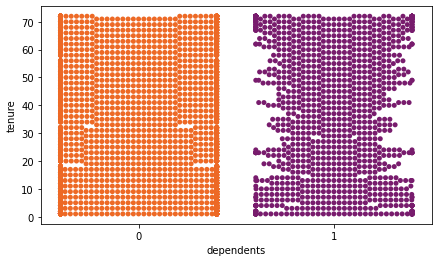

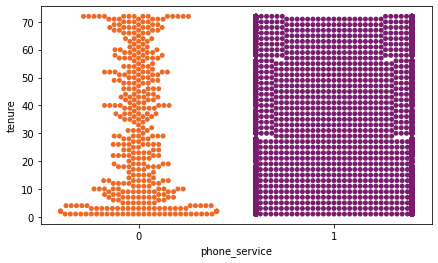

...

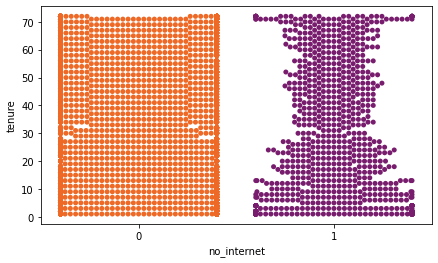

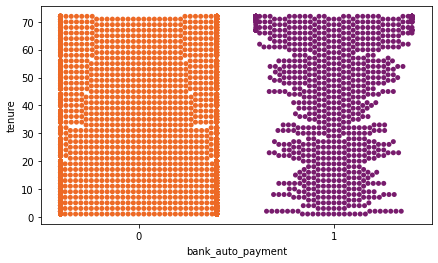

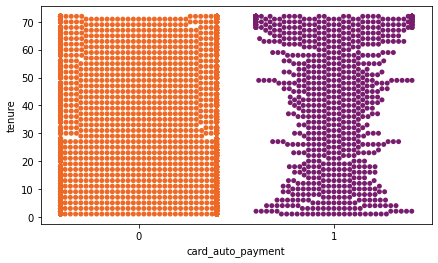

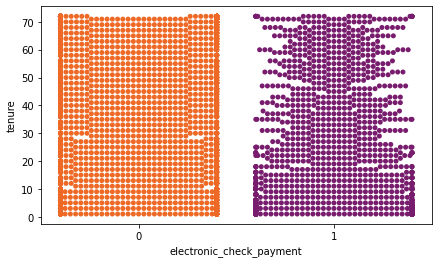

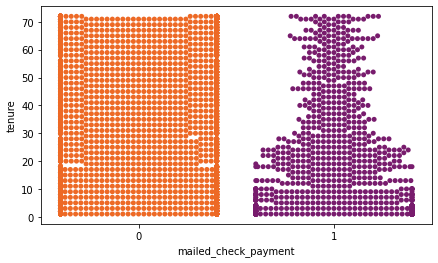

In [12]:
#visualize tenure (continuous) with discrete variables
for cat in cat_vars:
    plt.figure(figsize = (7, 4))
    sns.swarmplot(x = cat, y = 'tenure', data = train, palette = 'inferno_r');

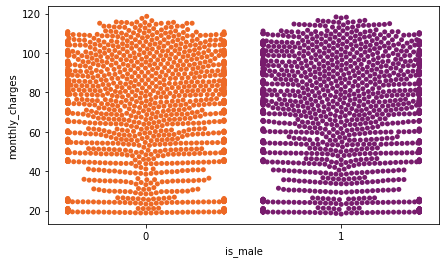

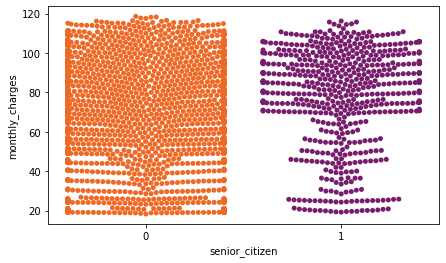

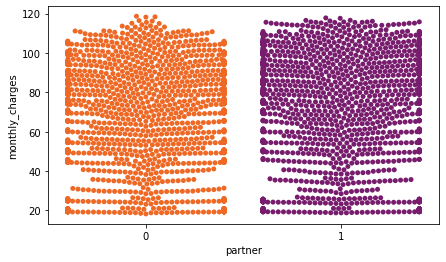

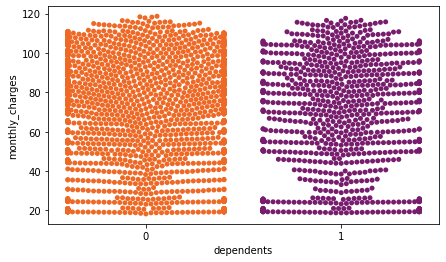

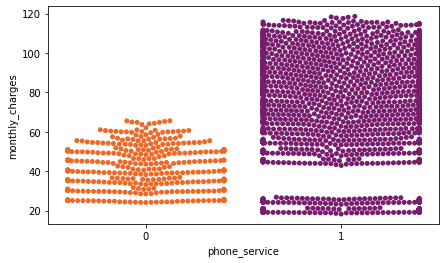

...

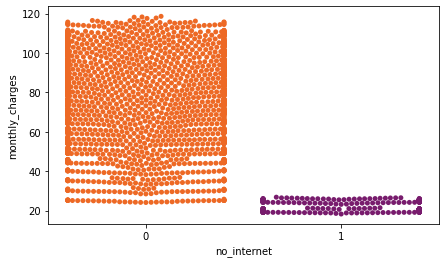

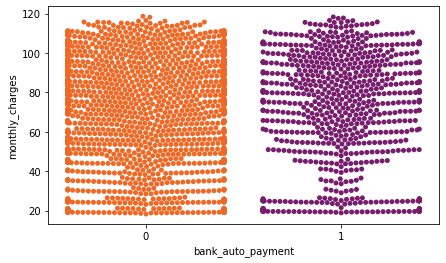

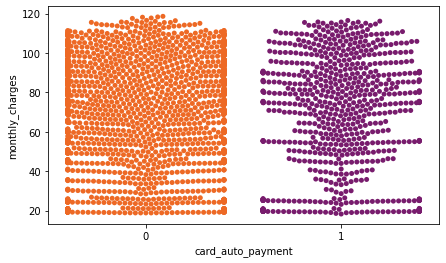

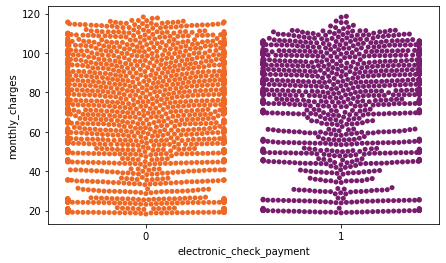

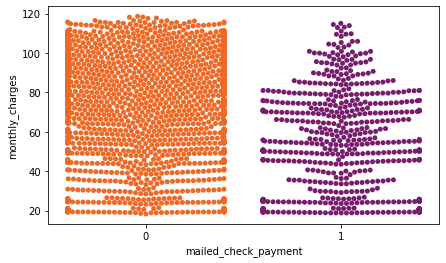

In [13]:
#visualize monthly charges (continuous) with discrete variables
for cat in cat_vars:
    plt.figure(figsize = (7, 4))
    sns.swarmplot(x = cat, y = 'monthly_charges', data = train, palette = 'inferno_r');

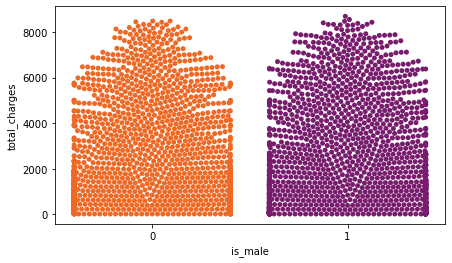

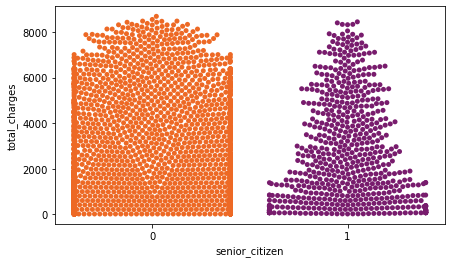

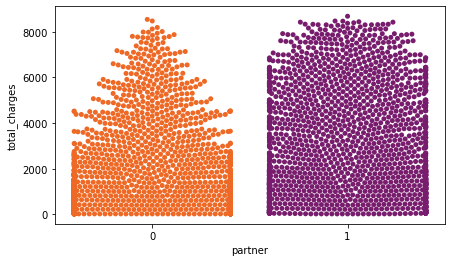

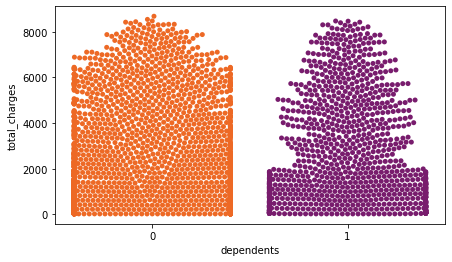

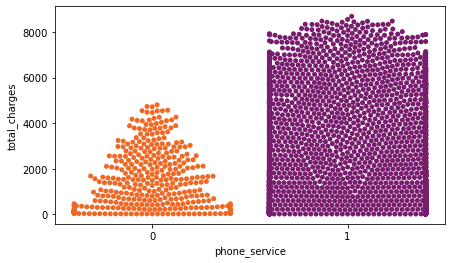

...

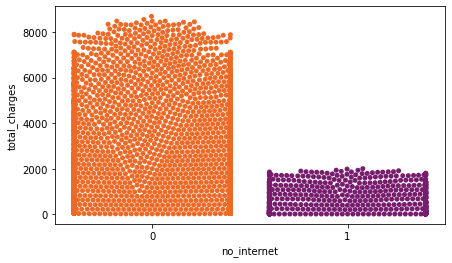

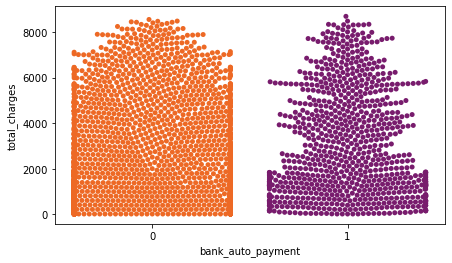

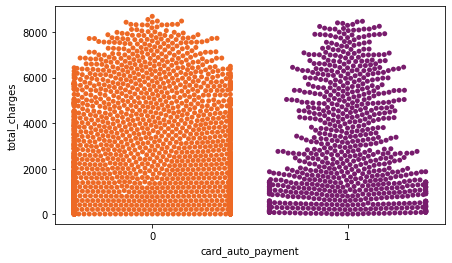

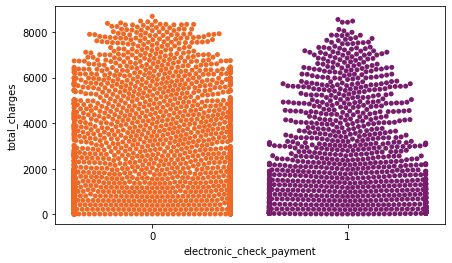

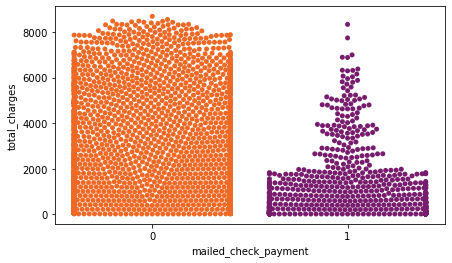

In [14]:
#visualize total charges (continuous) with discrete variables
for cat in cat_vars:
    plt.figure(figsize = (7, 4))
    sns.swarmplot(x = cat, y = 'total_charges', data = train, palette = 'inferno_r');

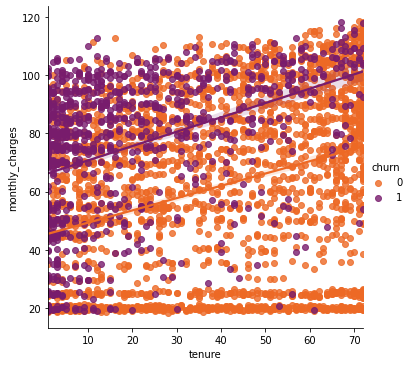

In [15]:
#visualize correlation between tenure and monthly charges
sns.lmplot(x = 'tenure', y = 'monthly_charges', data = train, hue = 'churn', palette = 'inferno_r');

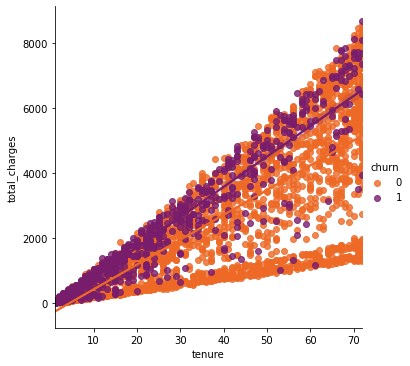

In [16]:
#visualize correlation between tenure and total charges
sns.lmplot(x = 'tenure', y = 'total_charges', data = train, hue = 'churn', palette = 'inferno_r');

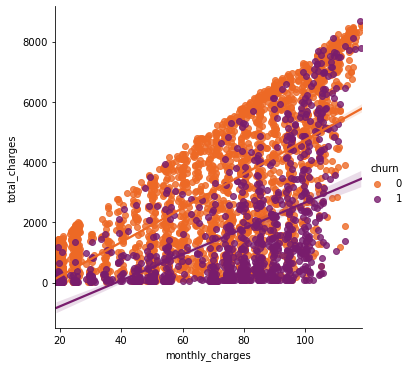

In [17]:
#visualize correlation between monthly charges and total charges
sns.lmplot(x = 'monthly_charges', y = 'total_charges', data = train, hue = 'churn', palette = 'inferno_r');

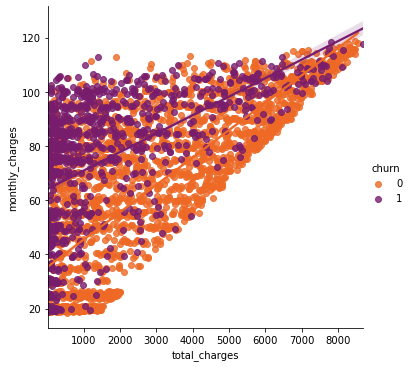

In [18]:
#upside-down
sns.lmplot(x = 'total_charges', y = 'monthly_charges', data = train, hue = 'churn', palette = 'inferno_r');

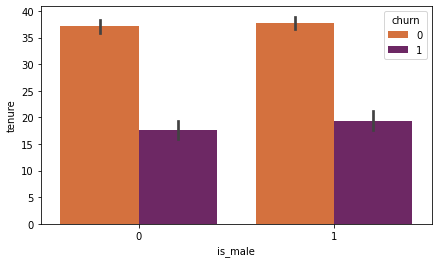

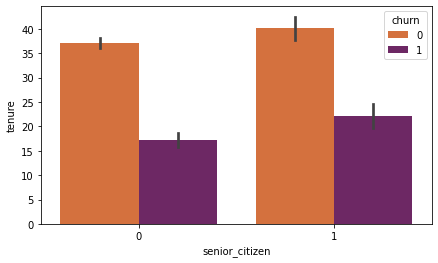

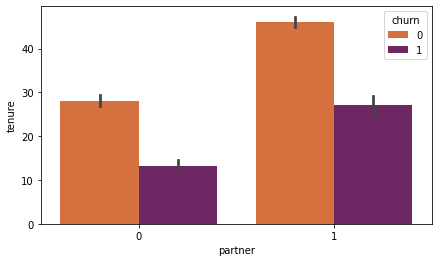

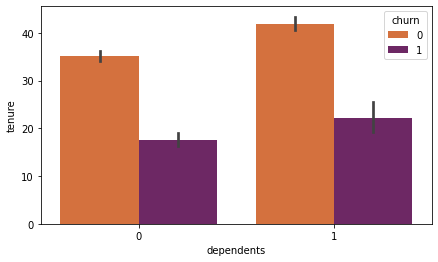

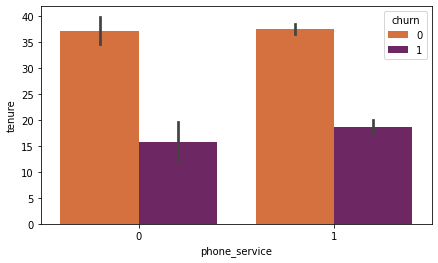

...

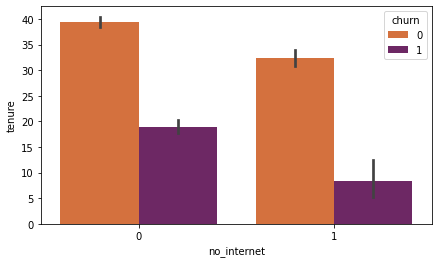

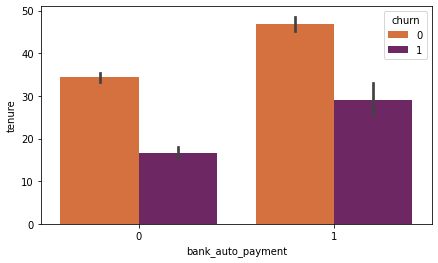

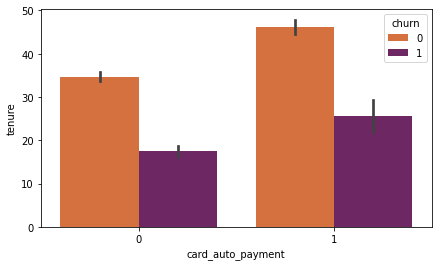

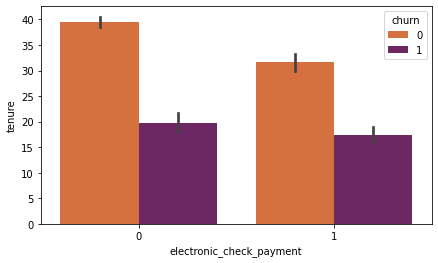

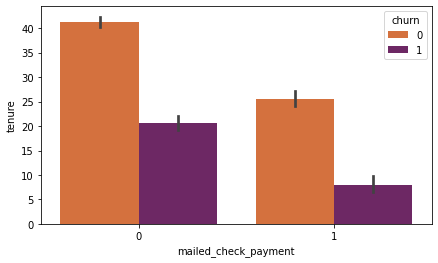

In [19]:
#visualize
for cat in cat_vars:
    plt.figure(figsize = (7, 4))
    sns.barplot(x = cat, y = 'tenure', data = train, hue = 'churn', palette = 'inferno_r');

### Exercise II
Write a function named plot_variable_pairs that accepts a dataframe as input and plots all of the pairwise relationships along with the regression line for each pair.

### Exercise III 
Write a function named months_to_years that accepts your telco churn dataframe and returns a dataframe with a new feature tenure_years, in complete years as a customer.

In [20]:
telco['tenure']

customer_id
2794-XIMMO    53
2851-STERV    35
2898-LSJGD    21
2969-WGHQO     7
2988-PLAHS     3
              ..
9178-JHUVJ    24
9257-AZMTZ    52
9537-JALFH    69
9574-BOSMD    68
9764-REAFF    59
Name: tenure, Length: 7032, dtype: int64

In [21]:
def months_to_years(df):
    import math
    df['tenure_years'] = df['tenure'] / 12
    df.tenure_years = df.tenure_years.apply(lambda x: math.floor(x))
    return df

In [22]:
months_to_years(telco)

,is_male,senior_citizen,partner,dependents,phone_service,paperless_billing,churn,payment_id,internet_service_id,contract_id,...,one_year_contract,two_year_contract,DSL_internet,Fiber_internet,no_internet,bank_auto_payment,card_auto_payment,electronic_check_payment,mailed_check_payment,tenure_years
customer_id,,,,,,,,,,,,,,,,,,,,,
2794-XIMMO,1,0,1,0,0,1,1,1,1,2,...,1,0,1,0,0,0,0,1,0,4
2851-STERV,1,1,0,0,1,1,0,1,1,2,...,1,0,1,0,0,0,0,1,0,2
2898-LSJGD,0,0,1,1,0,1,1,1,1,2,...,1,0,1,0,0,0,0,1,0,1
2969-WGHQO,0,0,1,1,1,0,0,1,1,2,...,1,0,1,0,0,0,0,1,0,0
2988-PLAHS,0,0,0,0,1,1,0,1,1,2,...,1,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9178-JHUVJ,1,0,1,1,1,1,0,3,3,3,...,0,1,0,0,1,1,0,0,0,2
9257-AZMTZ,0,0,1,1,1,0,0,3,3,3,...,0,1,0,0,1,1,0,0,0,4
9537-JALFH,1,0,1,1,1,0,0,3,3,3,...,0,1,0,0,1,1,0,0,0,5


### Exercise IV
Write a function named plot_categorical_and_continuous_vars that accepts your dataframe and the name of the columns that hold the continuous and categorical features and outputs 3 different plots for visualizing a categorical variable and a continuous variable.

### Exercise V
Save the functions you have written to create visualizations in your explore.py file. Rewrite your notebook code so that you are using the functions imported from this file.

### Exercise VI
Explore your dataset with any other visualizations you think will be helpful.

### Exercise VII
In a seperate notebook, use the functions you have developed in this exercise with the mall_customers dataset in the Codeup database server. You will need to write a sql query to acquire your data. Make spending_score your target variable.